# Feature Engineering and ML Pipeline Lab

# Context 
The bank noticed a decrease in its credit card user numbers. Due to the usage of credit cards being a big income for the bank; the bank wants to build a model to predict which type of customers might not use or stop using their credit cards.

# Objective 
To predict which type of customers might not use or stop using their credit cards and to examine the features that can lead to either the increase or decrease in credit card usage. 

# Data Description 
• CLIENTNUM: Client number. Unique identifier for the customer holding the account

• Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else
"Existing Customer" (target variable)

• Customer_Age: Age in Years

• Gender: The gender of the account holder

• Dependent_count: Number of dependents

• Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown,
Uneducated, College (refers to a college student), Post-Graduate, Doctorate

• Marital_Status: Marital Status of the account holder

• Income_Category: Annual Income Category of the account holder

• Card_Category: Type of Card

• Months_on_book: Period of relationship with the bank (in months)

• Total_Relationship_Count: Total no. of products held by the customer

• Months_Inactive_12_mon: No. of months inactive in the last 12 months

• Contacts_Count_12_mon: No. of Contacts in the last 12 months

• Credit_Limit: Credit Limit on the Credit Card

• Total_Revolving_Bal: Total Revolving Balance on the Credit Card

• Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)

• Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)

• Total_Trans_Amt: Total Transaction Amount (Last 12 months)

• Total_Trans_Ct: Total Transaction Count (Last 12 months)

• Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)

• Avg_Utilization_Ratio: Average Card Utilization Ratio

In [119]:
!pip  install compose

<IPython.core.display.Javascript object>

In [120]:
!pip install skimpy

<IPython.core.display.Javascript object>

# Importing Libraries

In [121]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np
from skimpy import clean_columns

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

# This will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

# Loading Data

In [122]:
# Loading the data
df = pd.read_csv("bank_churning.csv")

<IPython.core.display.Javascript object>

In [123]:
# let's create a copy of the data
data = df.copy()

<IPython.core.display.Javascript object>

# Basic Data Exploration

In [124]:
# Checking the number of rows and columns in the data
data.shape

(10127, 21)

<IPython.core.display.Javascript object>

Observation: The data set has 21 columns and 10127 rows

In [125]:
# let's view the first 5 rows of the data
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [126]:
# let's view the last 5 rows of the data
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


<IPython.core.display.Javascript object>

In [127]:
# let's check the data types of the columns in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

<IPython.core.display.Javascript object>

Observation- 

There are 21 columns and 10127 entries. 

We can see that Education level only has 8608 non null values and Marital Status has 9378 non null values as well, both columns are missing values. 

There are a few Columns that are objects and a few that are int64 and float64.

In [128]:
# let's check for duplicate values in the data
data.duplicated().sum()

0

<IPython.core.display.Javascript object>

In [129]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.000
Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

<IPython.core.display.Javascript object>

Observation: Education level has 15% missing values and Marital Status has 7.40% missing values.

# Summary of numerical features

In [130]:
# let's view the statistical summary of the numerical columns in the data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


<IPython.core.display.Javascript object>

Observations: 
* Clientnum is to identify the client, in this case we are not going to be needing that information for our analysis, therefore we will go ahead and drop this column later on. 
* Average customer age is 46 years old with a max of 73 years old. 
* Most of the customers have 3 dependents. 
* The average months a customers relationship with the bank is around 35 months. 
* Most customers have  3 number of products from the bank.
* Most customers have 3 months of being inactive in the last 12 months. 
* The average credit limit customers have is 8631.95.
* 75% of customers have an average utilization credit ratio of 0.503.
* The average total revolving balance is 1162.81.

# Data Processing

* We can drop the column - CLIENTNUM as it is unique for each customer and will not add value to the model.

In [131]:
# Dropping column - CLIENTNUM
data.drop(columns=["CLIENTNUM"], inplace=True)

<IPython.core.display.Javascript object>

In [132]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

<IPython.core.display.Javascript object>

# Fixing the data types

In [133]:
# Changing variable Attrition_Flag  to numeric
data["Attrition_Flag"].replace("Attrited Customer", 1, inplace=True)
data["Attrition_Flag"].replace("Existing Customer", 0, inplace=True)

<IPython.core.display.Javascript object>

In [134]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

<IPython.core.display.Javascript object>

In [135]:
# Selecting columns all columns of datatype object
cols = data.select_dtypes(["object"])
cols.columns

Index(['Gender', 'Education_Level', 'Marital_Status', 'Income_Category',
       'Card_Category'],
      dtype='object')

<IPython.core.display.Javascript object>

In [136]:
# Converting object type into categorical variables
for i in cols.columns:
    data[i] = data[i].astype("category")

<IPython.core.display.Javascript object>

In [137]:
# Printing new data info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  int64   
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

<IPython.core.display.Javascript object>

# Summary of categorical features

In [138]:
data.describe(include=["category"]).T

,count,unique,top,freq
Gender,10127,2,F,5358
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


<IPython.core.display.Javascript object>

Observations: 
* Most customers are females.
* Most have a Graduate education level. 
* Most are married and earning less than 40K.
* Most customers have a blue card.

Let's check the count of each unique category in each of the categorical variables.

In [139]:
# Making a list of all categorical variables
cat_col = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    print("-" * 40)

F    5358
M    4769
Name: Gender, dtype: int64
----------------------------------------
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
----------------------------------------
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
----------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
----------------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
----------------------------------------


<IPython.core.display.Javascript object>

Observations: 
* In terms of gender we have 5358 females and 4769 males. 
* In terms of education level, we know this variables has missing values but most have a graduate degree.
* Most customers are Married, this variable has missing values as well. 
* In income_category we see that most customers earn less that 40k per year; however we see that some are categorized as abc therefore we can add these observations to less than 40k per year category. 
* Most customers have the blue card following by the silver card. 
* The income_category has a unique value called "abc" these will be treated as missing values. 

# EDA

# Univariate Analysis

In [140]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

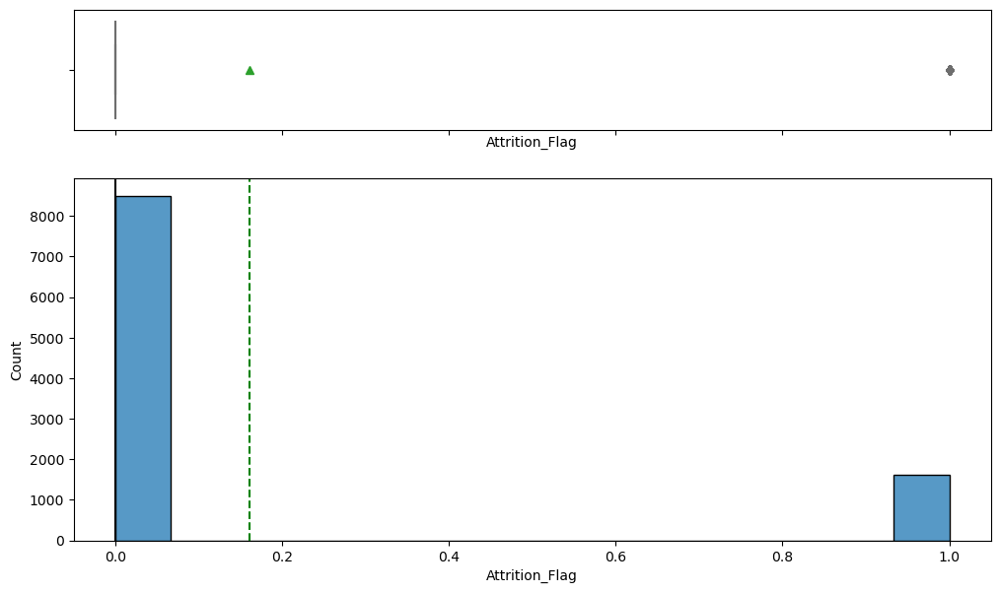

<IPython.core.display.Javascript object>

In [141]:
histogram_boxplot(data, "Attrition_Flag")

Observations: 
* Most Customers are existing customers and a few are attritited. We can see a class imbalance issue. 
* The variable has a few outliers as well. 

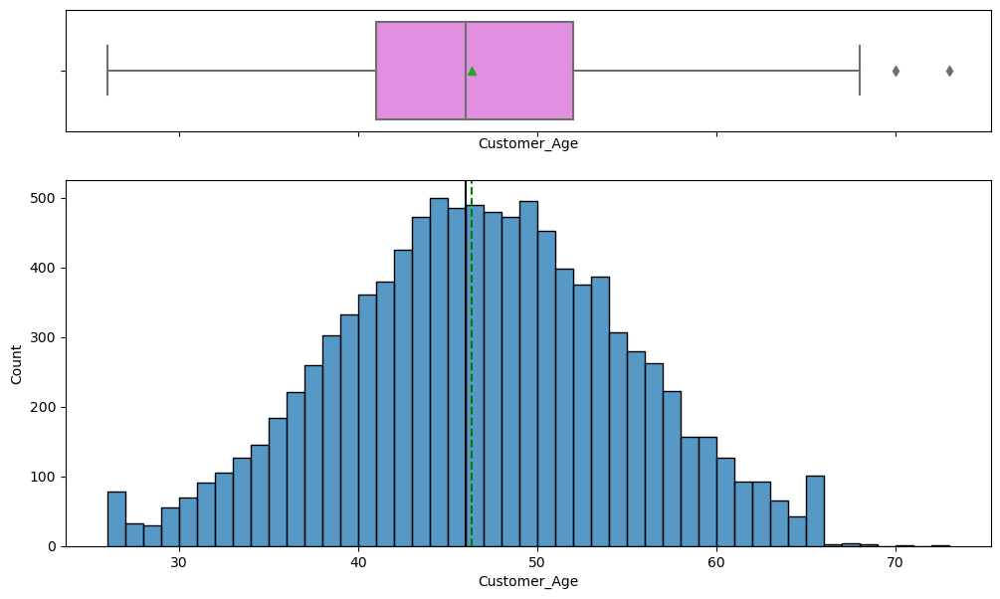

<IPython.core.display.Javascript object>

In [142]:
# Observations on Customer_age
histogram_boxplot(data, "Customer_Age")

Observations: 
* Variable doesnt have many outliers. 
* Age has a fairly normal distribution with approx equal mean and median.

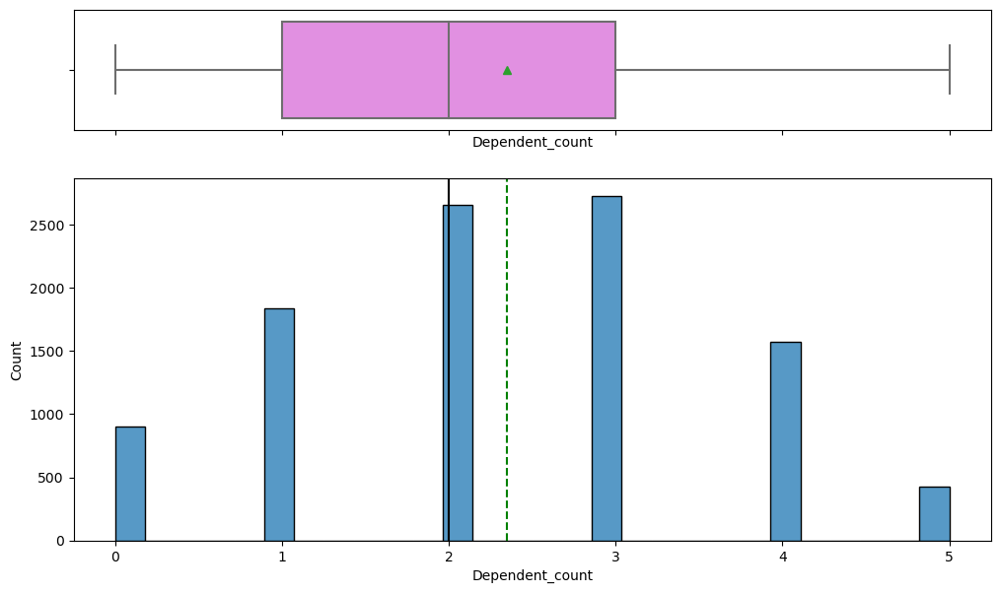

<IPython.core.display.Javascript object>

In [143]:
# Observations on Dependent_count
histogram_boxplot(data, "Dependent_count")

Observations: 
* This variable could be categorical in this case since there is a max of 5, we can see that most customers have 3 dependents. 
* This variable does not have any outliers.

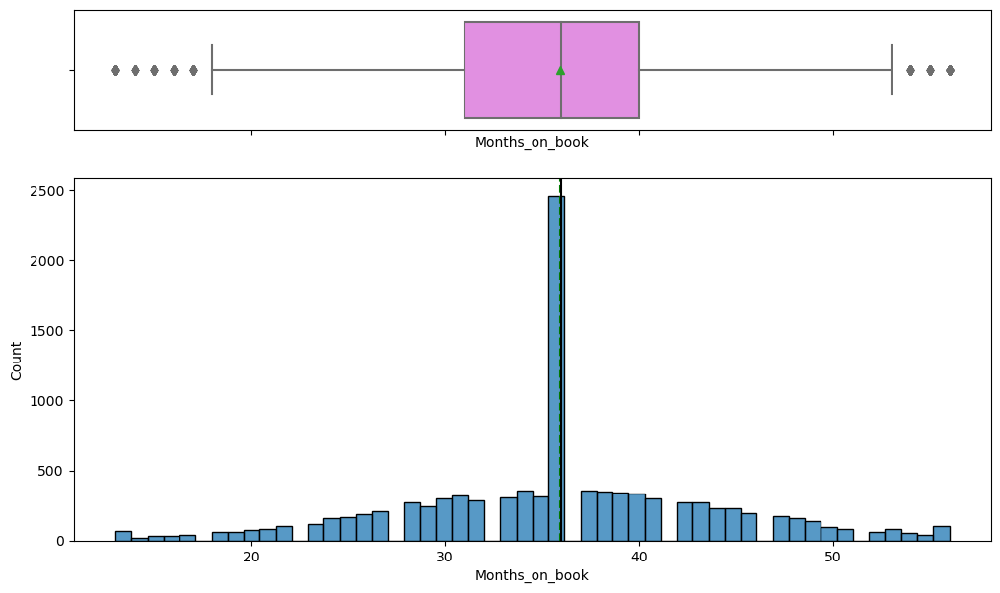

<IPython.core.display.Javascript object>

In [144]:
# Observations on Months_on_book
histogram_boxplot(data, "Months_on_book")

Observations: 
* This variable has some outliers. 
* Most customers have around 35-36 months of a relationship with the bank. It can be said that has a fairly normal distribution despite the fact of the huge peak; mean and median are approx equal. 

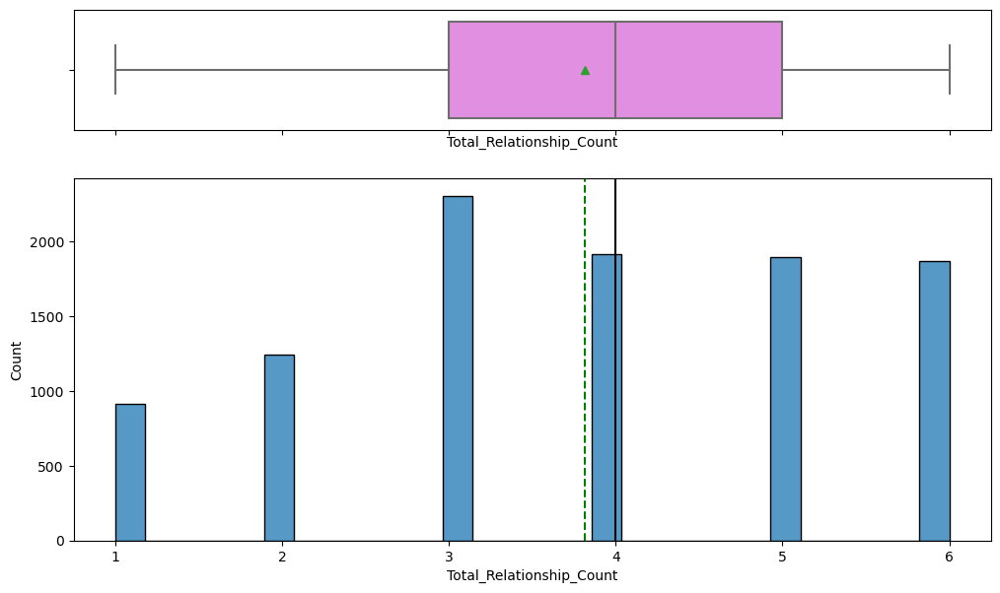

<IPython.core.display.Javascript object>

In [145]:
# Observations on Total_Relationship_Count
histogram_boxplot(data, "Total_Relationship_Count")

Observations: 
* Most customers have 3 number of products from the bank. 
* This variable doesnt have any outliers.

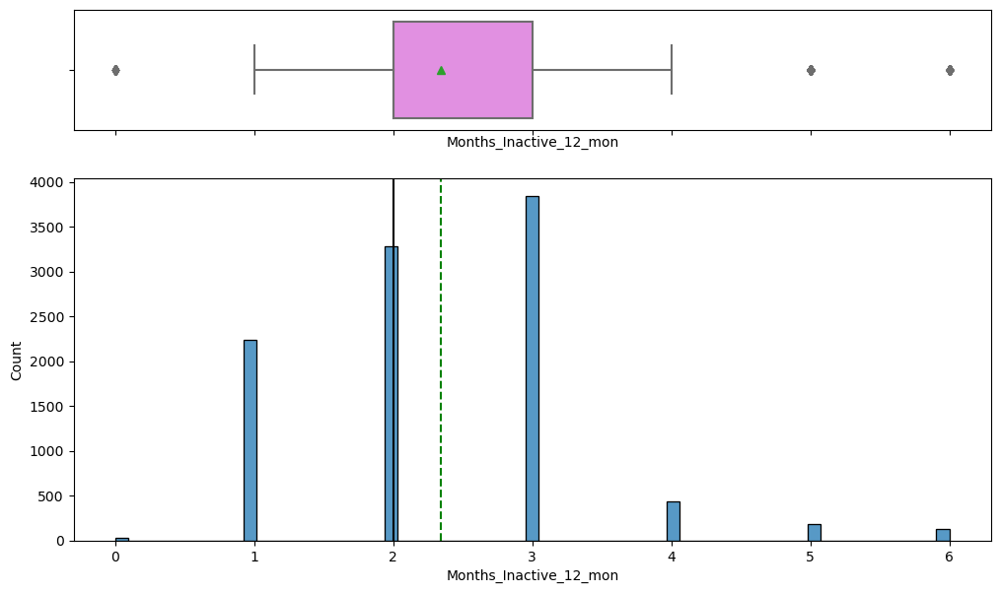

<IPython.core.display.Javascript object>

In [146]:
# Observations on Months_Inactive_12_mon
histogram_boxplot(data, "Months_Inactive_12_mon")

Observations: 
* Most customers have been 3 months inactive in a 12 months period. 
* This variable has some outliers. 

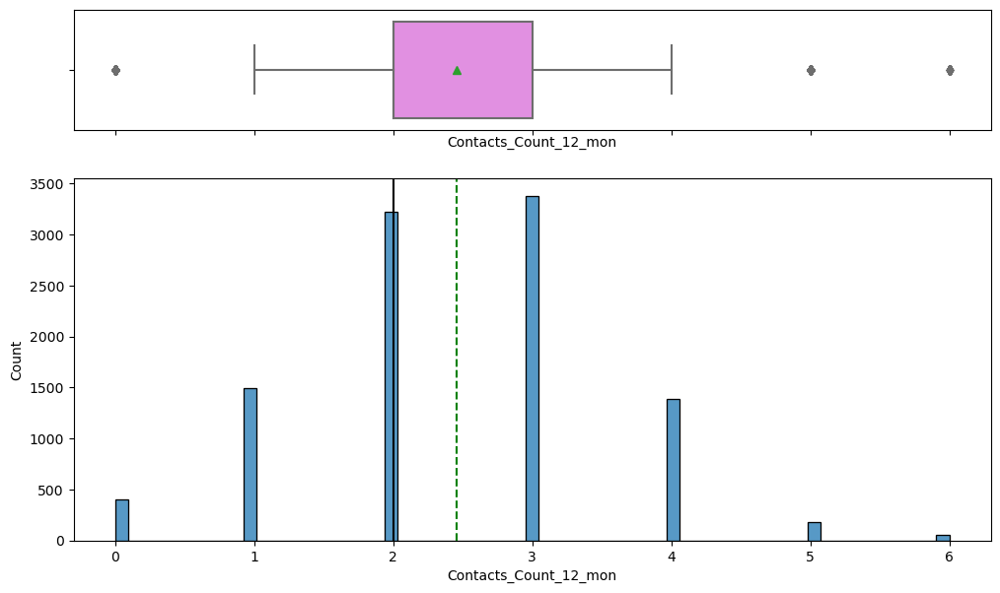

<IPython.core.display.Javascript object>

In [147]:
# Observations on Contacts_Count_12_mon
histogram_boxplot(data, "Contacts_Count_12_mon")

Observations: 
* Most customers have 3 number of contacts in a 12 months period. 
* This variable has some outliers.

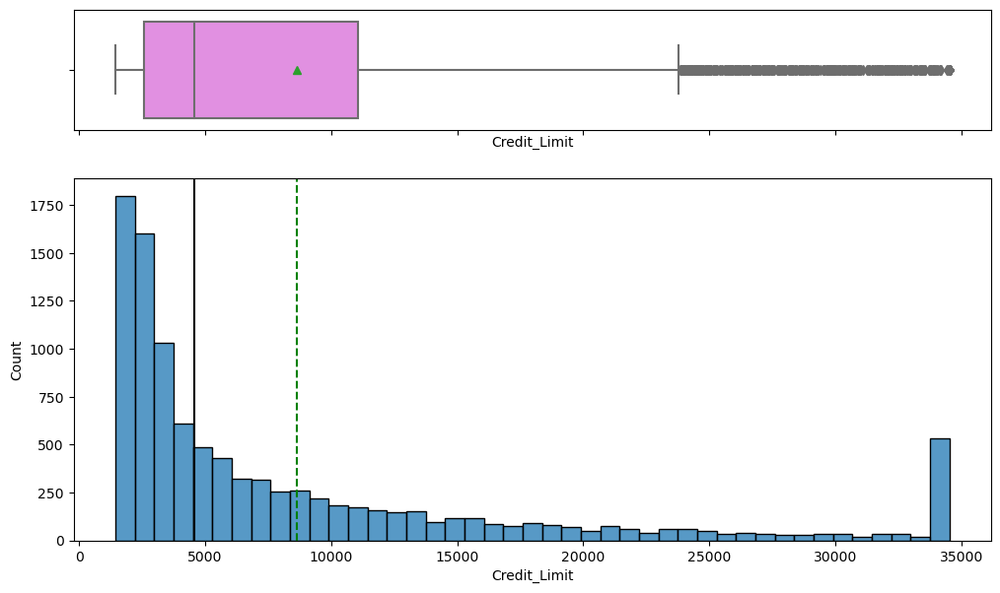

<IPython.core.display.Javascript object>

In [148]:
# Observations on Credit_Limit
histogram_boxplot(data, "Credit_Limit")

Observations: 
* Credit limit is right skewed. 
* Most customers have less than a 5000 credit limit. 
* This variable has many outliers. 

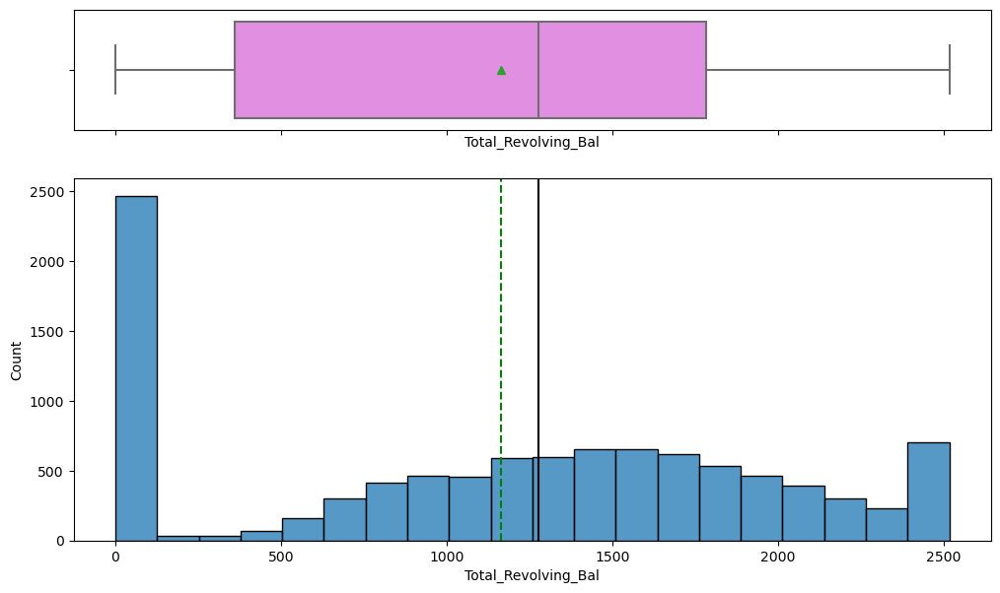

<IPython.core.display.Javascript object>

In [149]:
# Observations on Total_Revolving_Bal
histogram_boxplot(data, "Total_Revolving_Bal")

Observations: 
* Most customers have less than 500 in revolving balance. 
* This variable has no outliers. 

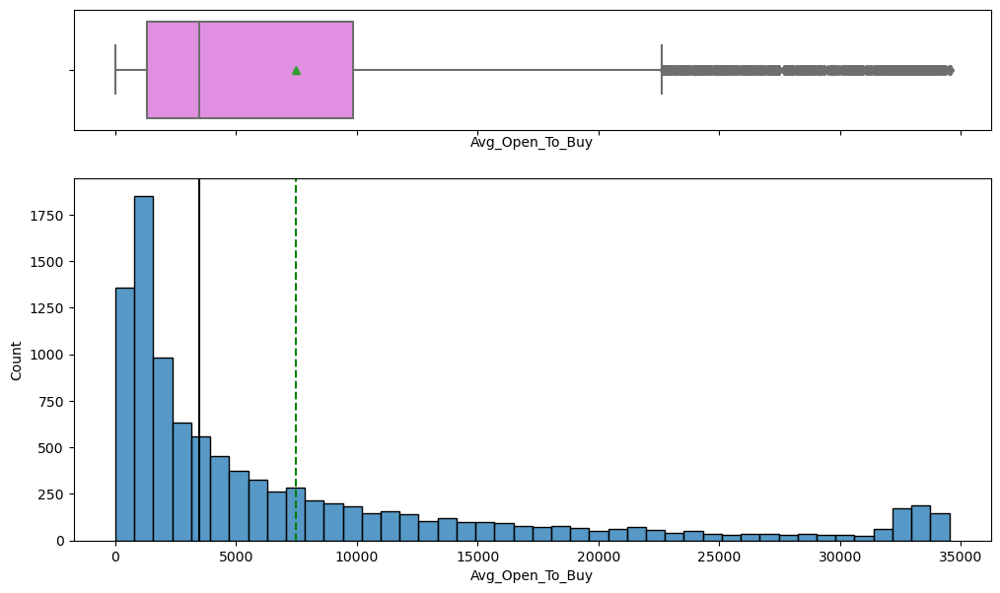

<IPython.core.display.Javascript object>

In [150]:
# Observations on Avg_Open_To_Buy
histogram_boxplot(data, "Avg_Open_To_Buy")

Observations: 
* Most customers are open to buy a line of credit less that 5000. 
* Avg_Open_To_Buy has many outliers and its right skewed.


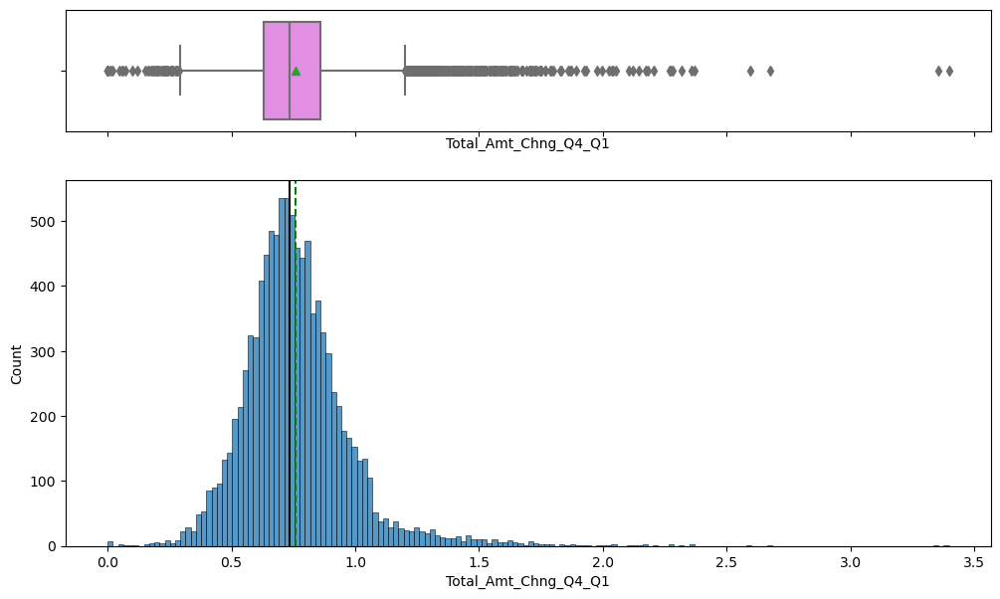

<IPython.core.display.Javascript object>

In [151]:
# Observations on Total_Amt_Chng_Q4_Q1
histogram_boxplot(data, "Total_Amt_Chng_Q4_Q1")

Observations:
* Most change in transaction about between Q4 and Q1 is around 0.75.
* This variable has a lot of outliers. It can be said that it has a fairly normal distribution as mean and median are approx equal.

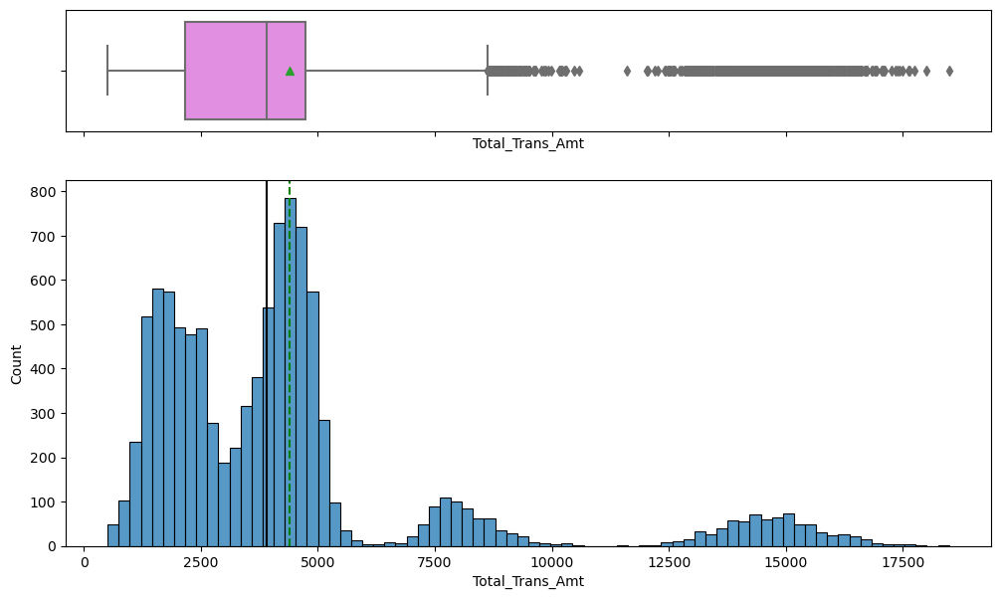

<IPython.core.display.Javascript object>

In [152]:
# Observations on Total_Trans_Amt
histogram_boxplot(data, "Total_Trans_Amt")

Observations: 
* The most total transaction amount was around 4000. 
* This variable has many outliers.

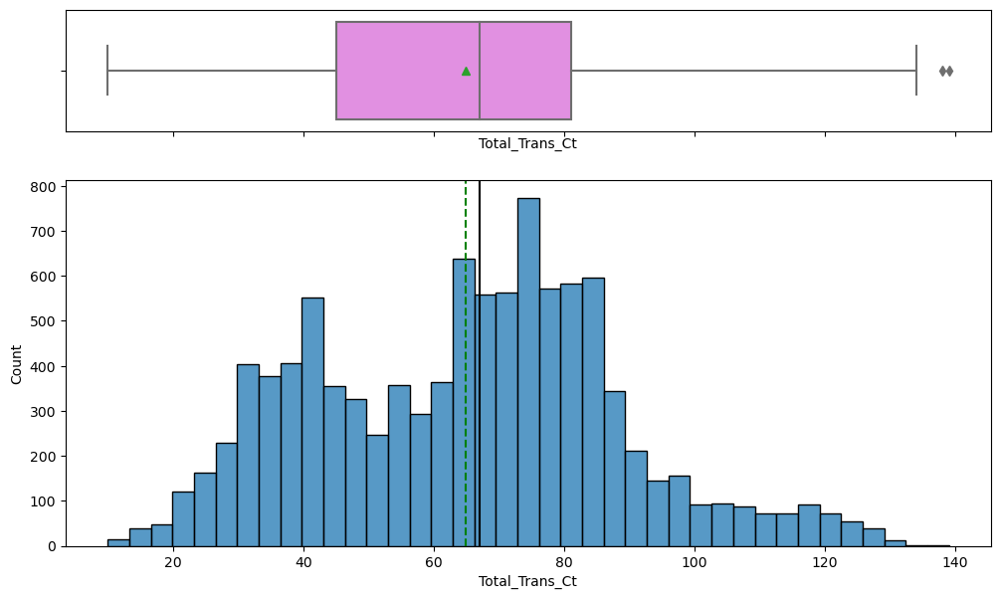

<IPython.core.display.Javascript object>

In [153]:
# Observations on Total_Trans_Ct
histogram_boxplot(data, "Total_Trans_Ct")

Observations: 
* Most total transaction counts were around 75-77 in the last 12 months. 
* This variable has very few outliers.

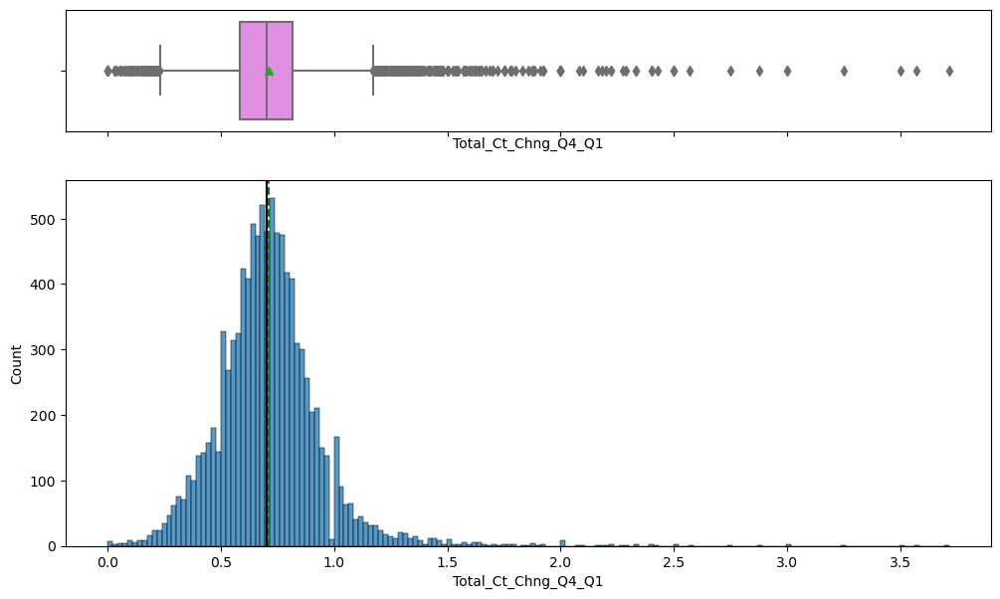

<IPython.core.display.Javascript object>

In [154]:
# Observations on Total_Ct_Chng_Q4_Q1
histogram_boxplot(data, "Total_Ct_Chng_Q4_Q1")

Observations: 
* Most total change in transaction counts between Q4 and Q1 are about 0.75.
* This variable has many outliers.

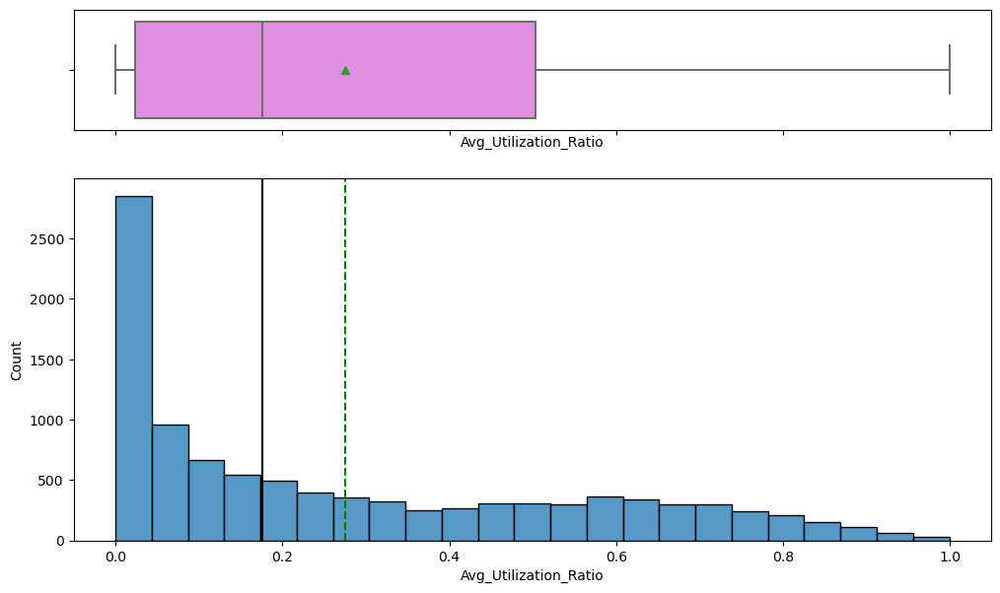

<IPython.core.display.Javascript object>

In [155]:
# Observations on Avg_Utilization_Ratio
histogram_boxplot(data, "Avg_Utilization_Ratio")

Observations: 
* Most average card utilization ratio is less than 0.1.
* This variable does not have any outliers.
* The histogram seems to be a bit right skewed.

In [156]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

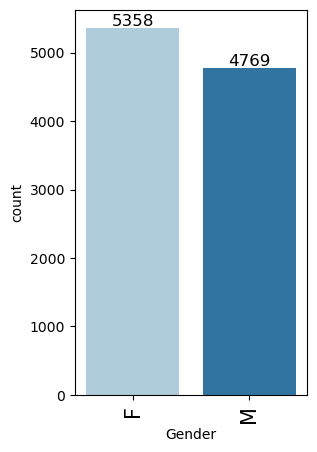

<IPython.core.display.Javascript object>

In [157]:
# observations on Gender
labeled_barplot(data, "Gender")

Observation: Most customers are female. 

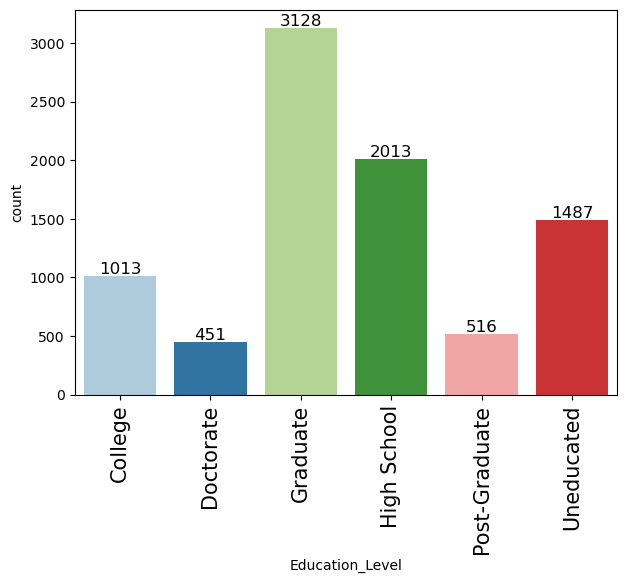

<IPython.core.display.Javascript object>

In [158]:
# observations on Education_Level
labeled_barplot(data, "Education_Level")

Observation: Most customer are have completed their graduate education. 

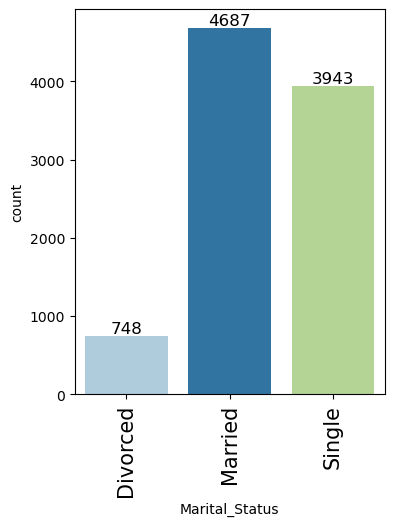

<IPython.core.display.Javascript object>

In [159]:
# observations on Marital_ Status
labeled_barplot(data, "Marital_Status")

Observation: Most customers are married.

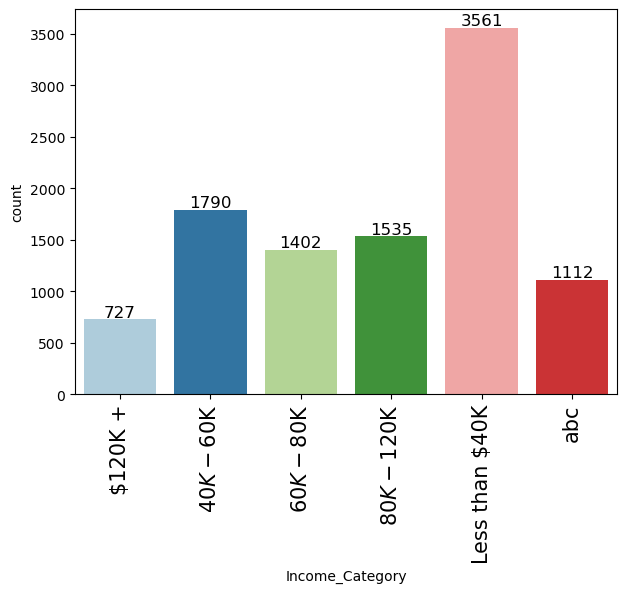

<IPython.core.display.Javascript object>

In [160]:
# observations on Income_Category
labeled_barplot(data, "Income_Category")

Observation: Most customers earn less than 40K, we will treat the abc count as missing values.

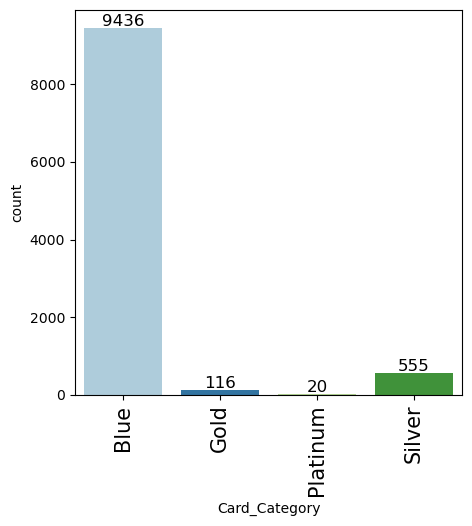

<IPython.core.display.Javascript object>

In [161]:
# observations on Card_Category
labeled_barplot(data, "Card_Category")

Observation: Most customers have the blue card. Very few have the Gold, Platinum and Silver.

# Bivariate Analysis

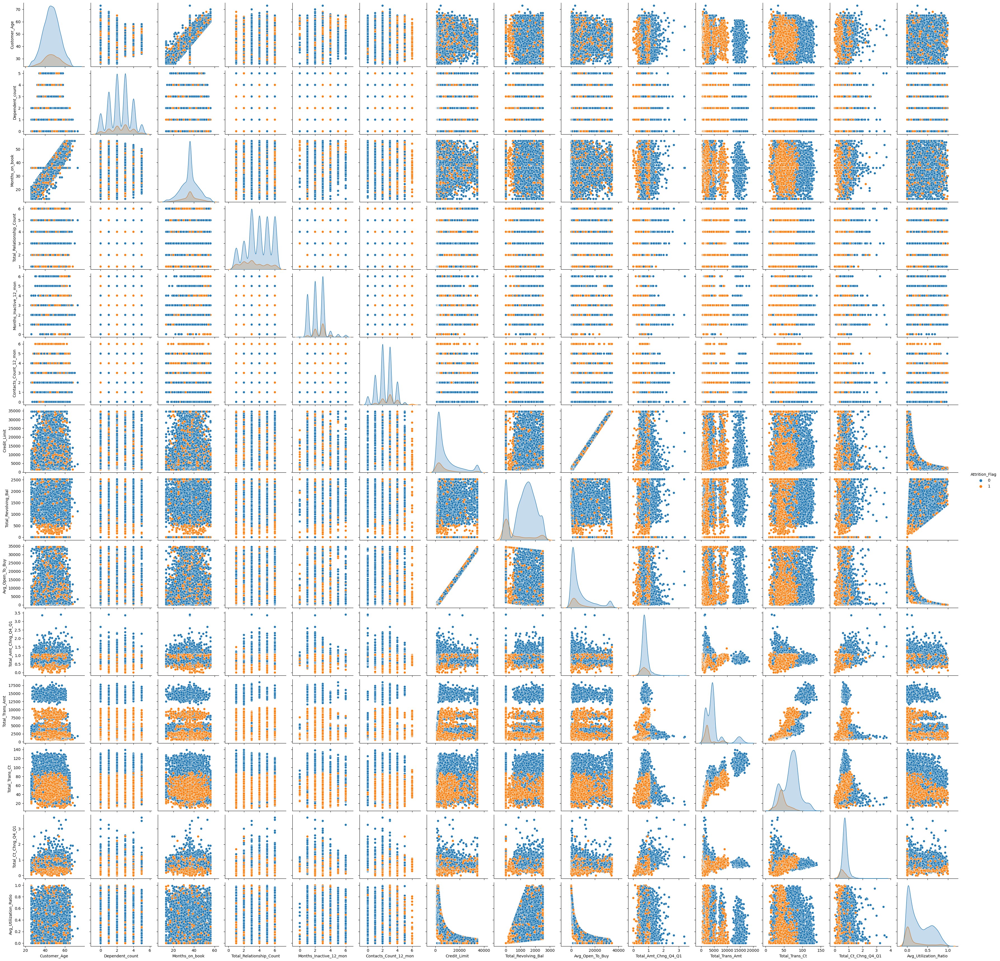

<IPython.core.display.Javascript object>

In [162]:
sns.pairplot(data, hue="Attrition_Flag")

Observation: There are many overlaps. We will investigate further by analyzing different variables with our target variable.

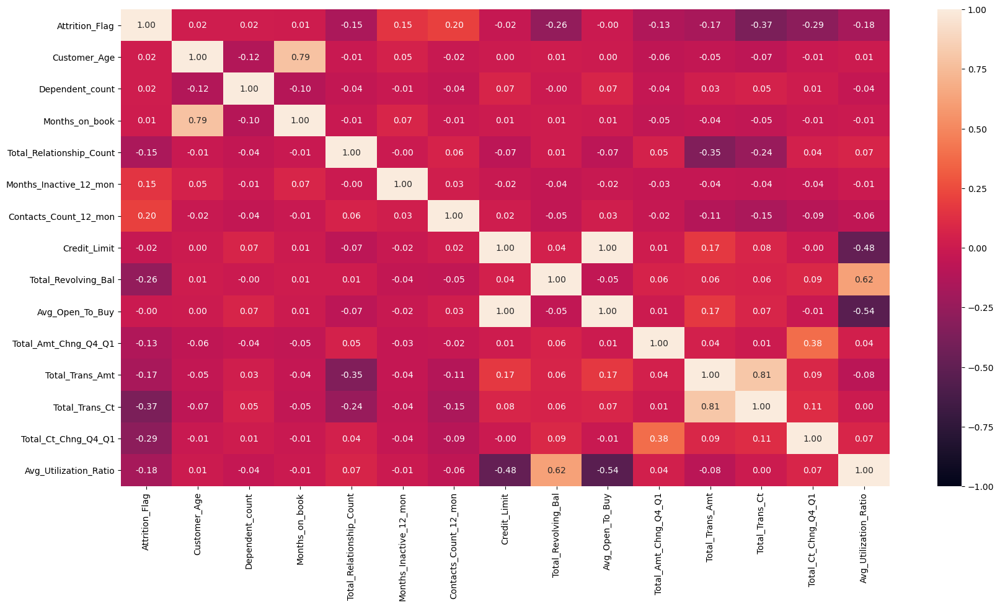

<IPython.core.display.Javascript object>

In [163]:
plt.figure(figsize=(20, 10))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f")
plt.show()

Observation: We can see that Countacts_count_12_mon is the highest positive correlated variable with our target variable (Attrition_Flag) Our most negatively correlated variables with Attrition_Flag are: Total_Revolving_bal, Total_Trans_Ct, and Total_Ct_Chng_Q4_Q1. However we see a highly negatively correlated pair: Avg_Utilization_Ratio with Avg_Open_To_Buy variables. Total_Revolving_Balance and Avg_Utilizzation_Ratio have the highest positive correlation. 

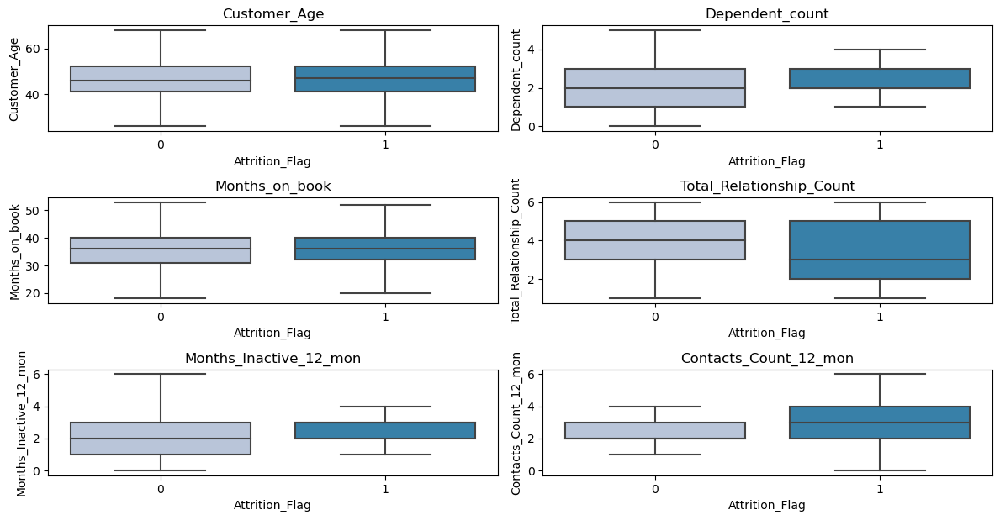

<IPython.core.display.Javascript object>

In [164]:
cols = data[
    [
        "Customer_Age",
        "Dependent_count",
        "Months_on_book",
        "Total_Relationship_Count",
        "Months_Inactive_12_mon",
        "Contacts_Count_12_mon",
    ]
].columns.tolist()
plt.figure(figsize=(12, 12))

for i, variable in enumerate(cols):
    plt.subplot(6, 2, i + 1)
    sns.boxplot(
        data["Attrition_Flag"], data[variable], palette="PuBu", showfliers=False
    )
    plt.tight_layout()
    plt.title(variable)
plt.show()

Observation: Customer age, dependent count, months on book, total relationship count and months inactive seem to have almost equal max attrition on both existing and attrited customers ; however contacts count 12 mon has more attrited customers (4) than existing. Contacts Count 12 mon is the number of times the customer was in contact with the bank.

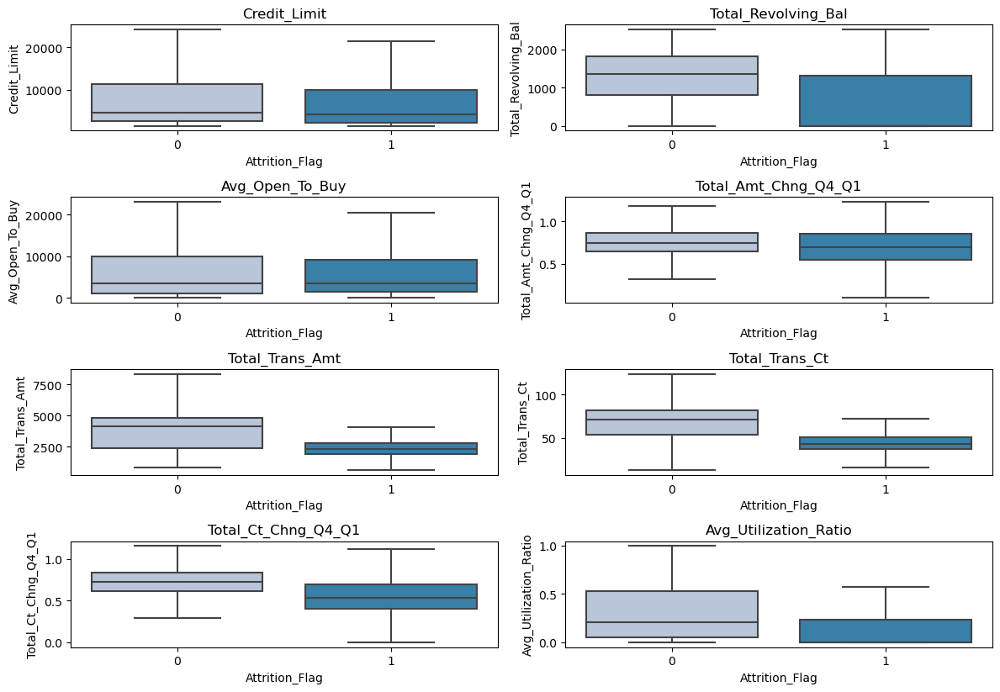

<IPython.core.display.Javascript object>

In [165]:
cols = data[
    [
        "Credit_Limit",
        "Total_Revolving_Bal",
        "Avg_Open_To_Buy",
        "Total_Amt_Chng_Q4_Q1",
        "Total_Trans_Amt",
        "Total_Trans_Ct",
        "Total_Ct_Chng_Q4_Q1",
        "Avg_Utilization_Ratio",
    ]
].columns.tolist()
plt.figure(figsize=(12, 12))

for i, variable in enumerate(cols):
    plt.subplot(6, 2, i + 1)
    sns.boxplot(
        data["Attrition_Flag"], data[variable], palette="PuBu", showfliers=False
    )
    plt.tight_layout()
    plt.title(variable)
plt.show()

Observation: 
* Customers with a bit higher credit limit are mostly existing customers.
* Customers with a higher revolving balance are mostly existing as well.
* Customers with higher total trans amount and total trans count are existing.
* Customers with higher total ct change Q4-Q1 and avg utilization ratio are existing.

In [166]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

<IPython.core.display.Javascript object>

Attrition_Flag     0     1    All
Gender                           
All             8500  1627  10127
F               4428   930   5358
M               4072   697   4769
------------------------------------------------------------------------------------------------------------------------


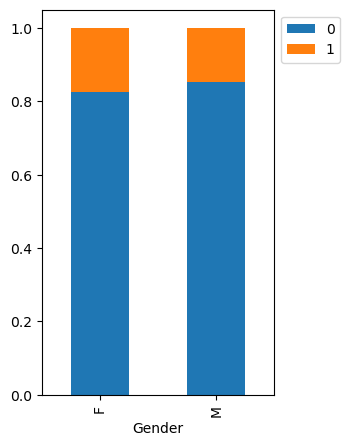

<IPython.core.display.Javascript object>

In [167]:
stacked_barplot(data, "Gender", "Attrition_Flag")

Observation: We can see that we have more female customers than male customers. We see that even though mostly out of 5358 females only 930 attrited. That is still a bit higher than males who have attrited. 

Attrition_Flag      0     1   All
Education_Level                  
All              7237  1371  8608
Graduate         2641   487  3128
High School      1707   306  2013
Uneducated       1250   237  1487
College           859   154  1013
Doctorate         356    95   451
Post-Graduate     424    92   516
------------------------------------------------------------------------------------------------------------------------


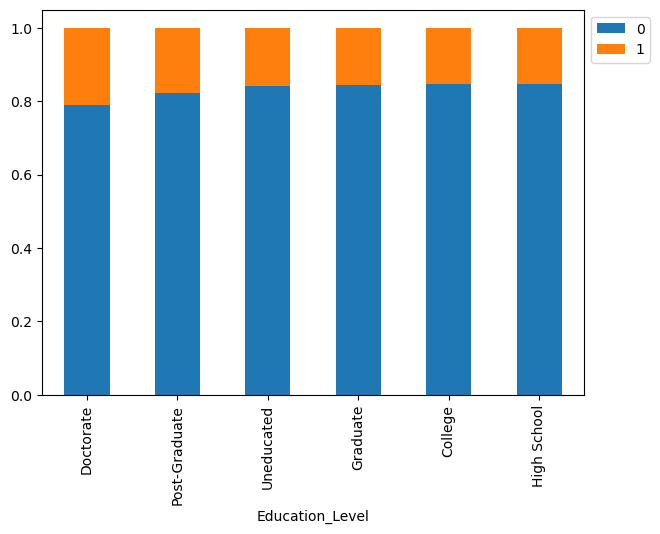

<IPython.core.display.Javascript object>

In [168]:
stacked_barplot(data, "Education_Level", "Attrition_Flag")

Obseervation: We can see that most of our customers have completed Graduate school. Doctorate and post graduate have higher attrited customers.

Attrition_Flag     0     1   All
Marital_Status                  
All             7880  1498  9378
Married         3978   709  4687
Single          3275   668  3943
Divorced         627   121   748
------------------------------------------------------------------------------------------------------------------------


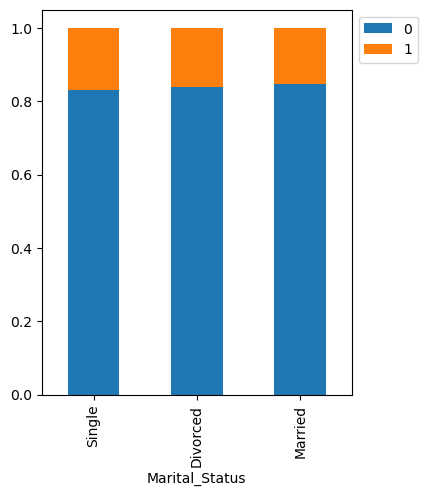

<IPython.core.display.Javascript object>

In [169]:
stacked_barplot(data, "Marital_Status", "Attrition_Flag")

Observation: We see that most of our customers are married. Single and divorced have a bit more attrited customers.

Attrition_Flag      0     1    All
Income_Category                   
All              8500  1627  10127
Less than $40K   2949   612   3561
$40K - $60K      1519   271   1790
$80K - $120K     1293   242   1535
$60K - $80K      1213   189   1402
abc               925   187   1112
$120K +           601   126    727
------------------------------------------------------------------------------------------------------------------------


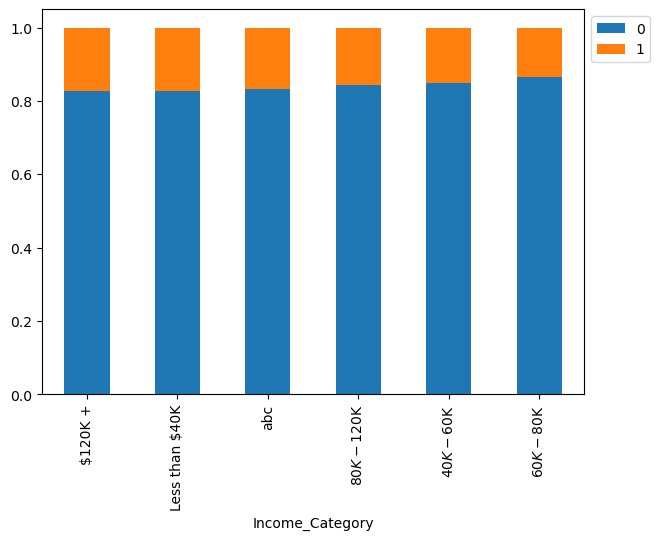

<IPython.core.display.Javascript object>

In [170]:
stacked_barplot(data, "Income_Category", "Attrition_Flag")

Observation: Most of our customers earn less than 40K. Less than 40K and 120K+ have the most attrited customers.

Attrition_Flag     0     1    All
Card_Category                    
All             8500  1627  10127
Blue            7917  1519   9436
Silver           473    82    555
Gold              95    21    116
Platinum          15     5     20
------------------------------------------------------------------------------------------------------------------------


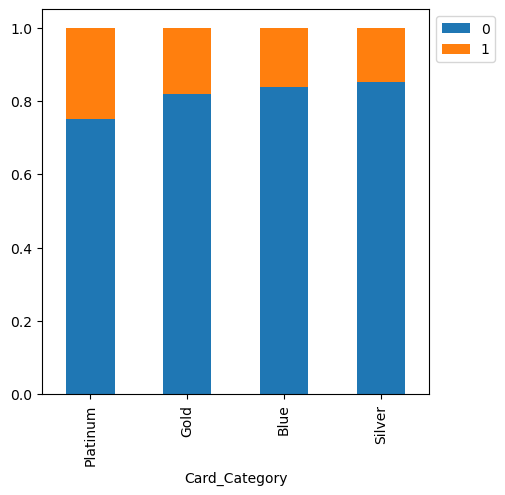

<IPython.core.display.Javascript object>

In [171]:
stacked_barplot(data, "Card_Category", "Attrition_Flag")

Observation: Most customers have the blue card. Platinum and Gold have the most attrited customers.

# Missing Value Treatment

Missing value treatment KNN imputer 

In [172]:
data.isnull().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

<IPython.core.display.Javascript object>

Observations: Education level and Marital Status have missing values, Income Category had some values as "abc" that we will also be treating as missing values. 

In [173]:
imputer = KNNImputer(n_neighbors=5)

<IPython.core.display.Javascript object>

In [174]:
# defining a list with names of columns that will be used for imputation- we will be using all columns
reqd_col_for_impute = list(data.columns)

<IPython.core.display.Javascript object>

In [175]:
reqd_col_for_impute.remove("Attrition_Flag")
reqd_col_for_impute

['Customer_Age',
 'Gender',
 'Dependent_count',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

<IPython.core.display.Javascript object>

In [176]:
# we need to pass numerical values for each categorical column for KNN imputation so we will be encoded
Gender = {"M": 0, "F": 1}
data["Gender"] = data["Gender"].map(Gender)

data["Income_Category"] = data["Income_Category"].replace("abc", float("NaN"))


Education_Level = {
    "Uneducated": 0,
    "High School": 1,
    "College": 2,
    "Graduate": 3,
    "Post-Graduate": 4,
    "Doctorate": 5,
}

data["Education_Level"] = data["Education_Level"].map(Education_Level)

Marital_Status = {
    "Divorced": 0,
    "Single": 1,
    "Married": 2,
}
data["Marital_Status"] = data["Marital_Status"].map(Marital_Status)

Income_Category = {
    "Less than $40K": 0,
    "$40K - $60K": 1,
    "$60K - $80K": 2,
    "$80K - $120K": 3,
    "$120K +": 4,
}
data["Income_Category"] = data["Income_Category"].map(Income_Category)

Card_Category = {
    "Blue": 0,
    "Silver": 1,
    "Gold": 2,
    "Platinum": 3,
}
data["Card_Category"] = data["Card_Category"].map(Card_Category)

<IPython.core.display.Javascript object>

In [177]:
# Making a list of all categorical variables
cat_col = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    print("-" * 40)

1    5358
0    4769
Name: Gender, dtype: int64
----------------------------------------
3    3128
1    2013
0    1487
2    1013
4     516
5     451
Name: Education_Level, dtype: int64
----------------------------------------
2    4687
1    3943
0     748
Name: Marital_Status, dtype: int64
----------------------------------------
0    3561
1    1790
3    1535
2    1402
4     727
Name: Income_Category, dtype: int64
----------------------------------------
0    9436
1     555
2     116
3      20
Name: Card_Category, dtype: int64
----------------------------------------


<IPython.core.display.Javascript object>

In [178]:
data.isnull().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category             1112
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

<IPython.core.display.Javascript object>

Observation: We want to make sure the NaN worked to make sure those abc observations are recorded as missing values.

# Data Preparation for Modeling

In [179]:
# Separating target variable and other variables
X = data.drop(columns="Attrition_Flag")
Y = data["Attrition_Flag"]

<IPython.core.display.Javascript object>

In [180]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test
X_temp, X_test, y_temp, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=1, stratify=Y
)

# then we split the temporary set into train and validation
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


<IPython.core.display.Javascript object>

# Imputing Missing Values

In [181]:
# Fit and transform the train data
X_train[reqd_col_for_impute] = imputer.fit_transform(X_train[reqd_col_for_impute])

# Transform the validation data
X_val[reqd_col_for_impute] = imputer.fit_transform(X_val[reqd_col_for_impute])

# Transform the test data
X_test[reqd_col_for_impute] = imputer.transform(X_test[reqd_col_for_impute])

<IPython.core.display.Javascript object>

In [182]:
# Checking that no column has missing values in train, validation or test sets
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

<IPython.core.display.Javascript object>

# Building the Models

We are looking for a model with the highest recall; greater the recall lesser the chances of false negatives and this providing the bank less risk of loosing money and resources. 

In [183]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 78.99476713762427
Random forest: 79.81214024071167
GBM: 81.96336996336997
Adaboost: 81.552590266876
Xgboost: 85.65358451072737
dtree: 78.48142333856619

Validation Performance:

Bagging: 0.803680981595092
Random forest: 0.852760736196319
GBM: 0.8588957055214724
Adaboost: 0.8773006134969326
Xgboost: 0.8834355828220859
dtree: 0.803680981595092


<IPython.core.display.Javascript object>

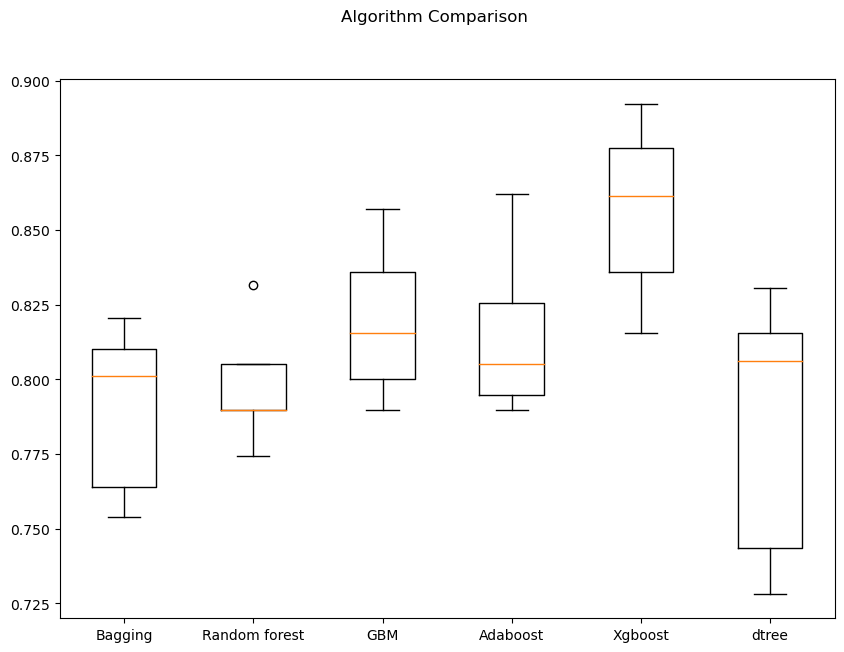

<IPython.core.display.Javascript object>

In [184]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

Observations: 
* We see that XG boost followed by GBM are giving the highest cross validated recall. 
* Both GBM and XG boost dont have any outliers.
* On the validation perfomance Adaboost is the highest followed by XGboost and GBM. 
* According to the boxplot GBM's median and max are a quite a bit higher than Adaboost therefore i will be tunning both GBM and XGBoost to see if their performace improves.

# Hyperparameter Tuning

In [185]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [186]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

# GBM

GridSearchCV

In [187]:
%%time 

# defining model
model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator=model, param_grid=parameters, scoring=scorer, cv=5, n_jobs = -1)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'max_features': 0.9, 'n_estimators': 250, 'subsample': 0.8} 
Score: 0.8554997383568812
CPU times: total: 7.42 s
Wall time: 1min 56s


<IPython.core.display.Javascript object>

In [188]:
# building model with best parameters
GBC_tuned1 = GradientBoostingClassifier(
    n_estimators=250, subsample=0.8, max_features=0.9,
)

# Fit the model on training data
GBC_tuned1.fit(X_train, y_train)

GradientBoostingClassifier(max_features=0.9, n_estimators=250, subsample=0.8)

<IPython.core.display.Javascript object>

In [189]:
# Calculating different metrics on train set
GBC_grid_train = model_performance_classification_sklearn(GBC_tuned1, X_train, y_train)
print("Training performance:")
GBC_grid_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.989,0.952,0.982,0.967


<IPython.core.display.Javascript object>

In [190]:
# Calculating different metrics on Test set
GBC_grid_test1 = model_performance_classification_sklearn(GBC_tuned1, X_test, y_test)
print("Test performance:")
GBC_grid_test1

Test performance:


,Accuracy,Recall,Precision,F1
0,0.979,0.920,0.949,0.934


<IPython.core.display.Javascript object>

In [191]:
# Calculating different metrics on validation set
GBC_grid_val = model_performance_classification_sklearn(GBC_tuned1, X_val, y_val)
print("Validation performance:")
GBC_grid_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.975,0.896,0.945,0.920


<IPython.core.display.Javascript object>

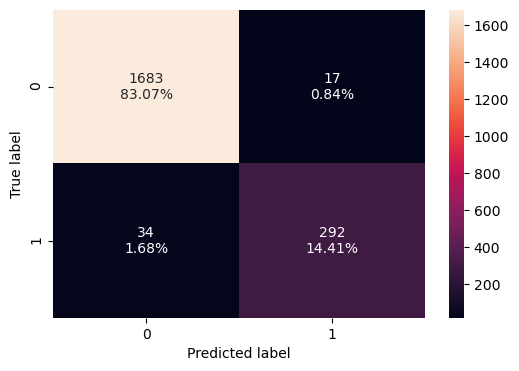

<IPython.core.display.Javascript object>

In [192]:
# creating confusion matrix
confusion_matrix_sklearn(GBC_tuned1, X_val, y_val)

Observations: 
* The validation recall (0.893) improved the cross validated recall of 81.963.
* We can see that this model has good recall, precision and F1 scores as well. 
* The false negative is only 1.73% which is good. Let's see if we can improve these scores by trying Randomized Search

# RandomizedSearchCV

In [193]:
%%time 

# defining model
model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=parameters, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.8, 'n_estimators': 250, 'max_features': 0.9} with CV score=0.8554997383568812:
CPU times: total: 8.27 s
Wall time: 1min 58s


<IPython.core.display.Javascript object>

In [194]:
# building model with best parameters
GBC_tuned2 = GradientBoostingClassifier(
    n_estimators=250, subsample=0.8, max_features=0.9,
)

# Fit the model on training data
GBC_tuned2.fit(X_train, y_train)

GradientBoostingClassifier(max_features=0.9, n_estimators=250, subsample=0.8)

<IPython.core.display.Javascript object>

In [195]:
# Calculating different metrics on train set
GBC_random_train = model_performance_classification_sklearn(
    GBC_tuned2, X_train, y_train
)
print("Training performance:")
GBC_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.991,0.957,0.985,0.971


<IPython.core.display.Javascript object>

In [196]:
# Calculating different metrics on test set
GBC_random_test = model_performance_classification_sklearn(GBC_tuned2, X_test, y_test)
print("Test performance:")
GBC_random_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.976,0.917,0.934,0.925


<IPython.core.display.Javascript object>

In [79]:
# Calculating different metrics on validation set
GBC_random_val = model_performance_classification_sklearn(GBC_tuned2, X_val, y_val)
print("Validation performance:")
GBC_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.974,0.899,0.939,0.918


<IPython.core.display.Javascript object>

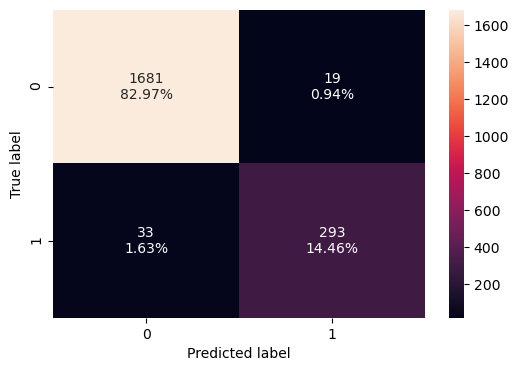

<IPython.core.display.Javascript object>

In [80]:
# creating confusion matrix
confusion_matrix_sklearn(GBC_tuned2, X_val, y_val)

Observations: 
* Validation recall improved a bit more from the Gridsearch output. 
* Our false negavites have also reduced to 1.63% which is great. 
* Still have precision and F1 scores.

# XGBoost

# GridSearchCV

In [81]:
%%time 

#defining model
model = XGBClassifier(random_state=1,eval_metric='logloss')

#Parameter grid to pass in GridSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling GridSearchCV
grid_cv = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorer, cv=5, n_jobs = -1, verbose= 2)

#Fitting parameters in GridSeachCV
grid_cv.fit(X_train,y_train)


print("Best parameters are {} with CV score={}:" .format(grid_cv.best_params_,grid_cv.best_score_))

Fitting 5 folds for each of 2304 candidates, totalling 11520 fits
Best parameters are {'gamma': 5, 'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 100, 'reg_lambda': 10, 'scale_pos_weight': 10, 'subsample': 0.9} with CV score=0.9712925170068027:
CPU times: total: 1min 43s
Wall time: 25min 22s


<IPython.core.display.Javascript object>

In [82]:
# building model with best parameters
xgb_tuned1 = XGBClassifier(
    random_state=1,
    n_estimators=100,
    scale_pos_weight=10,
    subsample=0.9,
    learning_rate=0.1,
    gamma=5,
    eval_metric="logloss",
    reg_lambda=10,
    max_depth=2,
)

# Fit the model on training data
xgb_tuned1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=5, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=2, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=1, ...)

<IPython.core.display.Javascript object>

In [83]:
# Calculating different metrics on train set
xgboost_grid_train = model_performance_classification_sklearn(
    xgb_tuned1, X_train, y_train
)
print("Training performance:")
xgboost_grid_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.901,0.986,0.620,0.761


<IPython.core.display.Javascript object>

In [84]:
# Calculating different metrics on test set
xgboost_grid_test = model_performance_classification_sklearn(xgb_tuned1, X_test, y_test)
print("Validation performance:")
xgboost_grid_test

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.893,0.978,0.602,0.746


<IPython.core.display.Javascript object>

In [85]:
# Calculating different metrics on validation set
xgboost_grid_val = model_performance_classification_sklearn(xgb_tuned1, X_val, y_val)
print("Validation performance:")
xgboost_grid_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.902,0.969,0.626,0.761


<IPython.core.display.Javascript object>

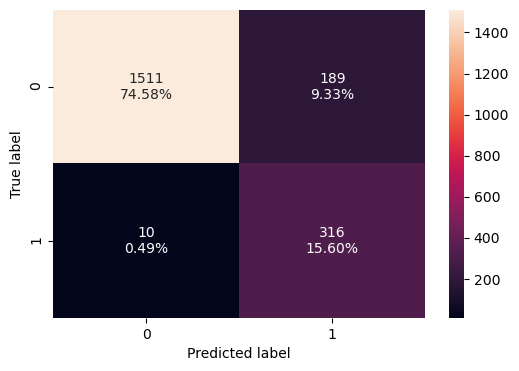

<IPython.core.display.Javascript object>

In [86]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned1, X_val, y_val)

Observations: 
* Validation perfomance of XGboost with Grid search improved from the initial cross validation performance.
* False negatives are only 0.49% which is perfect, however out the precision and F1 scores are pretty low.

# RandomizedSearchCV

In [87]:
%%time

# defining model
model = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
xgb_tuned2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
xgb_tuned2.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(xgb_tuned2.best_params_,xgb_tuned2.best_score_))

Best parameters are {'subsample': 0.8, 'scale_pos_weight': 10, 'reg_lambda': 10, 'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.1, 'gamma': 0} with CV score=0.9682260596546313:
CPU times: total: 3.88 s
Wall time: 33.9 s


<IPython.core.display.Javascript object>

In [88]:
# building model with best parameters
xgb_tuned2 = XGBClassifier(
    random_state=1,
    n_estimators=50,
    scale_pos_weight=10,
    gamma=0,
    subsample=0.8,
    learning_rate=0.1,
    eval_metric="logloss",
    max_depth=2,
    reg_lambda=10,
)
# Fit the model on training data
xgb_tuned2.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=2, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=50, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=1, ...)

<IPython.core.display.Javascript object>

In [89]:
# Calculating different metrics on train set
xgboost_random_train = model_performance_classification_sklearn(
    xgb_tuned2, X_train, y_train
)
print("Training performance:")
xgboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.849,0.984,0.516,0.677


<IPython.core.display.Javascript object>

In [90]:
# Calculating different metrics on test set
xgboost_random_test = model_performance_classification_sklearn(
    xgb_tuned2, X_test, y_test
)
print("Training performance:")
xgboost_random_test

Training performance:


,Accuracy,Recall,Precision,F1
0,0.846,0.975,0.510,0.670


<IPython.core.display.Javascript object>

In [91]:
# Calculating different metrics on validation set
xgboost_random_val = model_performance_classification_sklearn(xgb_tuned2, X_val, y_val)
print("Validation performance:")
xgboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.846,0.966,0.512,0.670


<IPython.core.display.Javascript object>

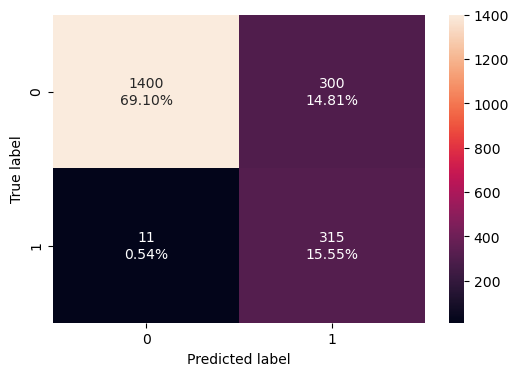

<IPython.core.display.Javascript object>

In [92]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned2, X_val, y_val)

Observation: 
* The reall for XGBoost with randomized search is pretty good but its a bit lower than Gridsearch.
* Our false negatives have also increased a bit more to 0.54%. 
* We see that it is also overfitting the traiining set.

# Comparing all models

In [93]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        GBC_grid_train.T,
        GBC_random_train.T,
        xgboost_grid_train.T,
        xgboost_random_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "GBC_Tuned_Grid_Search",
    "GBC_Tuned_Random_Search",
    "XGBoost_Tuned_Grid_Search",
    "XGBoost_Tuned_Random_Search",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,GBC_Tuned_Grid_Search,GBC_Tuned_Random_Search,XGBoost_Tuned_Grid_Search,XGBoost_Tuned_Random_Search
Accuracy,0.989,0.990,0.901,0.849
Recall,0.950,0.953,0.986,0.984
Precision,0.984,0.982,0.620,0.516
F1,0.967,0.967,0.761,0.677


<IPython.core.display.Javascript object>

In [94]:
# test performance comparison

models_test_comp_df = pd.concat(
    [GBC_grid_test1.T, GBC_random_test.T, xgboost_grid_test.T, xgboost_random_test.T,],
    axis=1,
)
models_test_comp_df.columns = [
    "GBC_Tuned_Grid_Test",
    "GBC_Tuned_Random_Test",
    "XGBoost_Tuned_Grid_Test",
    "XGBoost_Tuned_Random_Test",
]
print("Test performance comparison:")
models_test_comp_df

Test performance comparison:


,GBC_Tuned_Grid_Test,GBC_Tuned_Random_Test,XGBoost_Tuned_Grid_Test,XGBoost_Tuned_Random_Test
Accuracy,0.976,0.977,0.893,0.846
Recall,0.914,0.914,0.978,0.975
Precision,0.937,0.943,0.602,0.510
F1,0.925,0.928,0.746,0.670


<IPython.core.display.Javascript object>

Observations: 
* The best recall on test data is the XGboost with grid eventhough it has a low precision and F1 scores.

In [95]:
# Validation performance comparison

models_val_comp_df = pd.concat(
    [GBC_grid_val.T, GBC_random_val.T, xgboost_grid_val.T, xgboost_random_val.T,],
    axis=1,
)
models_val_comp_df.columns = [
    "GBC_Tuned_Grid_Val",
    "GBC_Tuned_Random_Val",
    "XGBoost_Tuned_Grid_Val",
    "XGBoost_Tuned_Random_Val",
]
print("Validation performance comparison:")
models_val_comp_df

Validation performance comparison:


,GBC_Tuned_Grid_Val,GBC_Tuned_Random_Val,XGBoost_Tuned_Grid_Val,XGBoost_Tuned_Random_Val
Accuracy,0.973,0.974,0.902,0.846
Recall,0.893,0.899,0.969,0.966
Precision,0.936,0.939,0.626,0.512
F1,0.914,0.918,0.761,0.670


<IPython.core.display.Javascript object>

Observations: 
* The XG Boost with Grid search has the highest validation recall of 0.969. 
* Both the precision and F1 scores are pretty low. 

# Performance on the test set

In [96]:
# Calculating different metrics on the test set
xgboost_grid_test = model_performance_classification_sklearn(xgb_tuned1, X_test, y_test)
print("Test performance:")
xgboost_grid_test

Test performance:


,Accuracy,Recall,Precision,F1
0,0.893,0.978,0.602,0.746


<IPython.core.display.Javascript object>

Observation: Recall is pretty good and high, precision and F1 are still pretty low.

# Features Importance

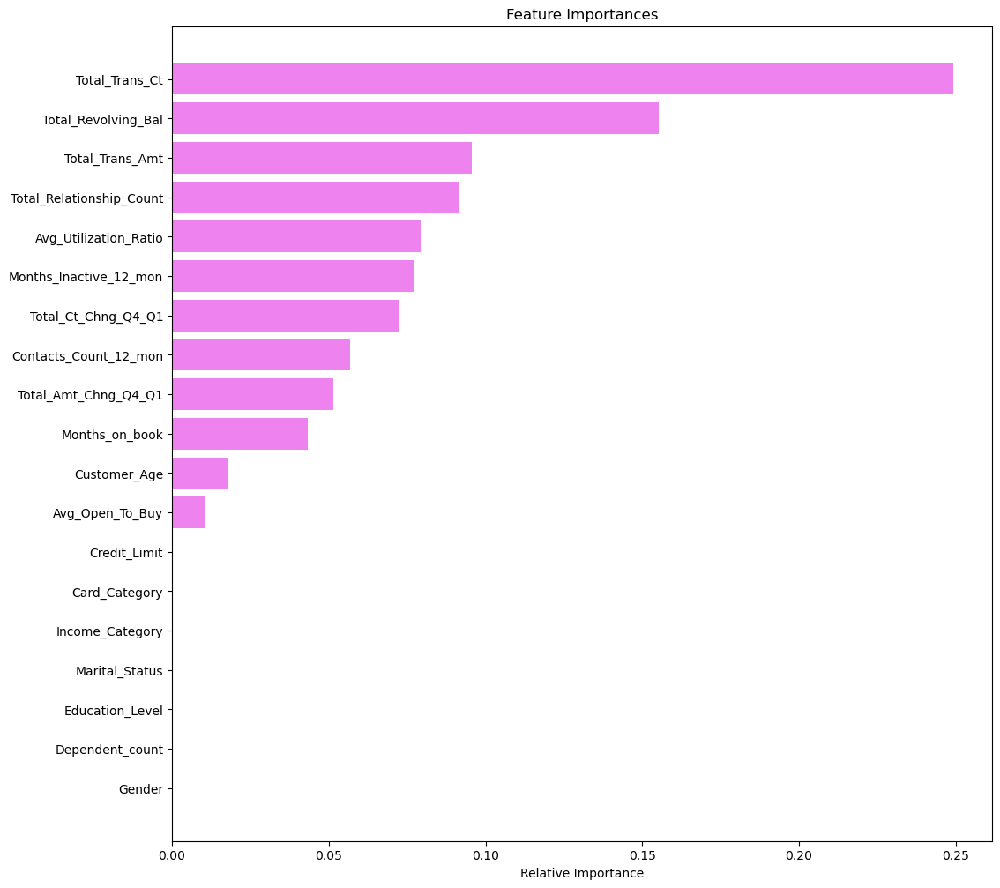

<IPython.core.display.Javascript object>

In [97]:
feature_names = X.columns
importances = xgb_tuned1.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

Observation: 
* The variables that impact a customer to stop utilizing their credit cards the most are: Total trans count, Total revolving balance, Total trans amount and Total relationship count. 

# Pipelines for productionizing the model

In [107]:
# Loading the data
df = pd.read_csv("bank_churning.csv")

<IPython.core.display.Javascript object>

In [108]:
# let's create a copy of the data
data = df.copy()

<IPython.core.display.Javascript object>

In [109]:
# Dropping column - CLIENTNUM
data.drop(columns=["CLIENTNUM"], inplace=True)

<IPython.core.display.Javascript object>

In [110]:
# Changing variable Attrition_Flag  to numeric
data["Attrition_Flag"].replace("Attrited Customer", 1, inplace=True)
data["Attrition_Flag"].replace("Existing Customer", 0, inplace=True)

#Defining categorical variables
# we need to pass numerical values for each categorical column for KNN imputation so we will be encoded
Gender = {"M": 0, "F": 1}
data["Gender"] = data["Gender"].map(Gender)

data["Income_Category"] = data["Income_Category"].replace("abc", float("NaN"))


Education_Level = {
    "Uneducated": 0,
    "High School": 1,
    "College": 2,
    "Graduate": 3,
    "Post-Graduate": 4,
    "Doctorate": 5,
}

data["Education_Level"] = data["Education_Level"].map(Education_Level)

Marital_Status = {
    "Divorced": 0,
    "Single": 1,
    "Married": 2,
}
data["Marital_Status"] = data["Marital_Status"].map(Marital_Status)

Income_Category = {
    "Less than $40K": 0,
    "$40K - $60K": 1,
    "$60K - $80K": 2,
    "$80K - $120K": 3,
    "$120K +": 4,
}
data["Income_Category"] = data["Income_Category"].map(Income_Category)

Card_Category = {
    "Blue": 0,
    "Silver": 1,
    "Gold": 2,
    "Platinum": 3,
}
data["Card_Category"] = data["Card_Category"].map(Card_Category)


<IPython.core.display.Javascript object>

In [111]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   float64
 5   Marital_Status            9378 non-null   float64
 6   Income_Category           9015 non-null   float64
 7   Card_Category             10127 non-null  int64  
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

<IPython.core.display.Javascript object>

Observation: since all my variables are now numerical i will only create a numerical variable column for my pipeline.

In [112]:
# First Pipeline: creating a list of numerical variables
numerical_features = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])



# handle_unknown = "ignore", allows model to handle any unknown category in the test data


preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data 
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes


<IPython.core.display.Javascript object>

In [113]:
# Separating target variable and other variables
X = data.drop(columns="Attrition_Flag")
Y = data["Attrition_Flag"]

<IPython.core.display.Javascript object>

In [114]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


<IPython.core.display.Javascript object>

In [115]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "XGB",
            XGBClassifier(
                random_state=1,
                n_estimators=50,
                scale_pos_weight=10,
                subsample=1,
                learning_rate=0.05,
                gamma=0,
                eval_metric="logloss",
                reg_lambda=10,
                max_depth=1,
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train, y_train)


Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Gender', 'Education_Level',
                                                   'Marital_Status',
                                                   'Income_Category',
                                                   'Card_Category',
                                                   'Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                            

<IPython.core.display.Javascript object>

# Conclusions:

* Most customers are existing customers, most have 3 dependents, most are female and  most have completed their graduate education.
* The average credit limit customers have is around 8632.
* Most customers are earning less than 40k. Less than 40k and 120k+ have the most attrited customers. 
* Most customers have the blue card; we see that platinum and Gold have the most attrited customers. Therefore, my suggestion to the bank would be to maybe incentivize the platinum and gold members with more rewards for them to use their credit cards.
* The two main feature importances that are impacting attrition are: Total transaction counts in the last 12 months and total revolving balance. Therefore, monitoring customers  with high transcion counts and high revolving balance should be a priority. Maybe using more incentives and rewards for customers paying their credit cards on time would help with attrition.